
<h1 align=center><font size = 5>Applied Data Science Capstone Project: The Battle of Neighborhoods</font></h1>
<h1 align=center><font size = 3>by: Abdel A. Elkhadiri</font></h1>


## Problem Statement:

Mediterranean diet has again exceeded all expectations to rank yet as top diet according to the US World News. It is generally accepted that the people in countries bordering the Mediterranean Sea live longer and suffer less than most Americans from cancer and cardiovascular ailments. The not-so-surprising secret is an active lifestyle, weight control, and a diet low in red meat, sugar and saturated fat and high in produce, nuts and other healthful foods. The Mediterranean Diet may offer a host of health benefits, including weight loss, heart and brain health, cancer prevention, and diabetes prevention and control. By following the Mediterranean Diet, you could also keep that weight off while avoiding chronic disease.
There isn't "a" Mediterranean diet. Greeks eat differently from Italians, who eat differently from the French and Spanish. But they share many of the same principles. Working with some health experts a Greek restauranter entrepreneur who recently migrated to New York city wants to open and develop an affordable, consumer friendly Mediterranean restaurant that will serve a variety of Mediterranean dishes. The restauranter and in addition to his business plan hired me as a Data Scientist to explore the best neighborhood in New York City to open his new venture using a well-defined Data Science Methodology and Framework to evaluate New York neighborhoods and the Mediterranean Venues.

Hence, the problem statement that will try to answer in this report is:  <b>What’s the best New York City Neighborhood to Open a new Mediterranean Restaurant? </b>


In [1]:
# Import all required libraries for the project
import pandas as pd
import numpy as np
import requests
import json
import folium
import time

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

# Clustering and finding the best Cluster using Elbow Method
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.datasets.loaders import load_nfl

# Use the quick method and immediately show the figure
from yellowbrick.cluster.elbow import kelbow_visualizer

print('Libraries imported successfully.')

Libraries imported successfully.


## Part I: Data Exploration & Selection

Download New York City neighborhood data from IBM Cloud using requests python package

In [2]:
resp = requests.get('https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json')
ny_json_data = resp.json()

print('NY Neighborhoods data downloaded successfully.')

NY Neighborhoods data downloaded successfully.


After downloading the data, we explore the content

In [3]:
# Explore the downloaded data by ("Printing each key-value pair from JSON response")
for key, value in ny_json_data.items():
    print(key, ":", value)

type : FeatureCollection
totalFeatures : 306
features : [{'type': 'Feature', 'id': 'nyu_2451_34572.1', 'geometry': {'type': 'Point', 'coordinates': [-73.84720052054902, 40.89470517661]}, 'geometry_name': 'geom', 'properties': {'name': 'Wakefield', 'stacked': 1, 'annoline1': 'Wakefield', 'annoline2': None, 'annoline3': None, 'annoangle': 0.0, 'borough': 'Bronx', 'bbox': [-73.84720052054902, 40.89470517661, -73.84720052054902, 40.89470517661]}}, {'type': 'Feature', 'id': 'nyu_2451_34572.2', 'geometry': {'type': 'Point', 'coordinates': [-73.82993910812398, 40.87429419303012]}, 'geometry_name': 'geom', 'properties': {'name': 'Co-op City', 'stacked': 2, 'annoline1': 'Co-op', 'annoline2': 'City', 'annoline3': None, 'annoangle': 0.0, 'borough': 'Bronx', 'bbox': [-73.82993910812398, 40.87429419303012, -73.82993910812398, 40.87429419303012]}}, {'type': 'Feature', 'id': 'nyu_2451_34572.3', 'geometry': {'type': 'Point', 'coordinates': [-73.82780644716412, 40.887555677350775]}, 'geometry_name': 'g

As you see in the above json output most of the data is in features key, hence, we will need to parse the features key and explore the first item the list so we can start our data transformation to pandas dataframe.

In [4]:
ny_neighborhood_data = ny_json_data['features']
# Now let's take a look at the first item in this list
ny_neighborhood_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

Now we can build our dataframe using <b>ny_neighborhood_data</b>. Since we will be using <b>Foursquare</b> project, we will need to extract neighborhood names stored in properties, borough and coordinates (latitude, longitude)

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
ny_neighborhoods = pd.DataFrame(columns=column_names)

# Build our New York neighborhood dataframe
for data in ny_neighborhood_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    ny_neighborhoods = ny_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

Let's take a look at our a newly created dataframe and record the number of boroughs and neighborhoods in our newly created data frame.

In [7]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(ny_neighborhoods['Borough'].unique()),
        ny_neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [8]:
# Display the first 10 neighborhoods info in our dataframe.
ny_neighborhoods.head(10)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


Let's now find out how many neighborhoods in each New York borough

In [ ]:
# Number of neighborhoods in each borough
ny_neighborhoods.groupby('Borough').count()['Neighborhood']

In [9]:
#Create list with the Boroughs
ny_boroughs = ny_neighborhoods['Borough'].unique().tolist()
ny_boroughs

['Bronx', 'Manhattan', 'Brooklyn', 'Queens', 'Staten Island']

Now let's visualize our dataframe and distribution of all the boroughs and their corresponding neighborhoods in New York City
<p><b><font color=red>Please note that map sometimes doesn't display using GitHub even if the notebook is Trusted. However, you can see the maps part of the final report</font></b></p>

In [10]:
# This will color categorize each borough
borough_color = {}
for borough in ny_boroughs:
    borough_color[borough]= '#%02X%02X%02X' % tuple(np.random.choice(range(256), size=3)) #Random color

In [11]:
# Visualize all the borough in NY
# First we get the NY latitude and Longitude
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
ny_location = geolocator.geocode(address)
ny_latitude = ny_location.latitude
ny_longitude = ny_location.longitude

print('The geograpical coordinate of New York City are {}, {}.'.format(ny_latitude, ny_longitude))

# Now let's build the map
map_newyork = folium.Map(location=[ny_latitude, ny_longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(ny_neighborhoods['Latitude'], 
                                           ny_neighborhoods['Longitude'],
                                           ny_neighborhoods['Borough'], 
                                           ny_neighborhoods['Neighborhood']):
    label_text = borough + ' - ' + neighborhood
    label = folium.Popup(label_text)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=borough_color[borough],
        fill_color=borough_color[borough],
        fill_opacity=0.8).add_to(map_newyork)  
    
map_newyork

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


Now let's get the associated venues in the New York City Borough and neighborhoods. For this we will use <b>Foursquare Venue API</b>

In [12]:
# Now will get the Foursquare credentials so we can start exploring the venues
CLIENT_ID = '3INJDU2QZCTORAFNMLLRUGT3XE2XCHIJPJA0MZPWRZYH3ACB' # your Foursquare ID
CLIENT_SECRET = 'U02WHHBKIM5TP1SYLG105RA5WF4NGW325ZF00ANS1QLJRU1X' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3INJDU2QZCTORAFNMLLRUGT3XE2XCHIJPJA0MZPWRZYH3ACB
CLIENT_SECRET:U02WHHBKIM5TP1SYLG105RA5WF4NGW325ZF00ANS1QLJRU1X


This is method to get all the nearby venues in a neighborhood within a pre defined radius. In order to get all the NY venues, as the list is very large we will let our request to try to make a REST call to the Foursquare API every 5 seconds until we get all the venues in our neighborhoods dataframe.

In [13]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        
        results = ''
        while results == '':
            try:
                # make the GET request
                results = requests.get(url).json()["response"]['groups'][0]['items']
                break
            except:
                print("Connection refused by the server..")
                print("Let me sleep for 5 seconds and retry to reconnect")
                time.sleep(5)
                print("now let me continue...")
                continue
                
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [14]:
# get all the venues in our dataset
#Get venues for all manhattan neighborhoods in our dataset
ny_venues = getNearbyVenues(names=ny_neighborhoods['Neighborhood'],
                                latitudes=ny_neighborhoods['Latitude'],
                                longitudes=ny_neighborhoods['Longitude'])

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

Let's explore all the New York Venues obtained

In [15]:
# Number of New York Venues
ny_venues.shape

(10105, 7)

In [16]:
#Let's get the first 10 venues
ny_venues.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
2,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop
5,Wakefield,40.894705,-73.847201,Shell,40.894187,-73.845862,Gas Station
6,Wakefield,40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place
7,Wakefield,40.894705,-73.847201,Central Deli,40.896728,-73.844387,Deli / Bodega
8,Wakefield,40.894705,-73.847201,Louis Pizza,40.898399,-73.848810,Pizza Place
9,Wakefield,40.894705,-73.847201,Koss Quick Wash,40.891281,-73.849904,Laundromat


Let's now check the number of venues per neighborhood.

In [17]:
# Let's check the number of venues per neighborhood
ny_venues.groupby('Neighborhood').count()


,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,30,30,30,30,30,30
Annadale,11,11,11,11,11,11
Arden Heights,5,5,5,5,5,5
Arlington,6,6,6,6,6,6
Arrochar,22,22,22,22,22,22
...,...,...,...,...,...,...
Woodhaven,25,25,25,25,25,25
Woodlawn,25,25,25,25,25,25
Woodrow,21,21,21,21,21,21


Now, Let's get the number of unique categories in our ny_venues dataframe, print all the venue categories and confirm there is a category with Meditterranean Restaurt which we will analyzing for our project.

In [18]:
# Get the number of unique categories
print('There are {} uniques categories.'.format(len(ny_venues['Venue Category'].unique())))

There are 428 uniques categories.


In [19]:
# print the venue categories in NY
print("The New York Venue Categories are", ny_venues['Venue Category'].unique())

The New York Venue Categories are ['Dessert Shop' 'Pharmacy' 'Ice Cream Shop' 'Donut Shop' 'Gas Station'
 'Sandwich Place' 'Deli / Bodega' 'Pizza Place' 'Laundromat'
 'Discount Store' 'Post Office' 'Bagel Shop' 'Grocery Store'
 'Fast Food Restaurant' 'Restaurant' 'Bus Station' 'Baseball Field'
 'Chinese Restaurant' 'Trail' 'Park' 'Bar' 'Accessories Store' 'Diner'
 'Caribbean Restaurant' 'Seafood Restaurant' 'Bowling Alley'
 'Automotive Shop' 'Food & Drink Shop' 'Metro Station' 'Convenience Store'
 'Juice Bar' 'Bus Stop' 'Cosmetics Shop' 'Plaza' 'River'
 'Medical Supply Store' 'Bank' 'Moving Target' 'Food Truck' 'Home Service'
 'Gym' 'Playground' 'Gourmet Shop' 'Latin American Restaurant'
 'Burger Joint' 'Beer Bar' 'Warehouse Store' 'Mexican Restaurant' 'Pub'
 'Coffee Shop' 'Spanish Restaurant' 'Supermarket' 'Wings Joint' 'Bakery'
 'Thrift / Vintage Store' 'Candy Store' 'Rental Car Location' 'Café'
 'Supplement Shop' 'Fried Chicken Joint' 'Mattress Store' 'Breakfast Spot'
 'Pet Store' '

In [20]:
# Check if they are any Mediterranean Restaurant Restaurant
"Mediterranean Restaurant" in ny_venues['Venue Category'].unique()

True

## Part II: Data Transformation

Now we use one hot encoding to process categorical variables by converting them into a form which we can later use in our machine learning model. 

In [21]:
# one hot encoding
to_onehot = pd.get_dummies(ny_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
to_onehot['Neighborhoods'] = ny_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [to_onehot.columns[-1]] + list(to_onehot.columns[:-1])
to_onehot = to_onehot[fixed_columns]

print(to_onehot.shape)
to_onehot.head()

(10105, 429)


,Neighborhoods,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Wakefield,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Wakefield,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Wakefield,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Wakefield,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Wakefield,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [22]:
to_grouped = to_onehot.groupby(["Neighborhoods"]).mean().reset_index()

print(to_grouped.shape)
to_grouped.head(10)

(302, 429)


,Neighborhoods,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,...,Warehouse Store,Waste Facility,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Allerton,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,Annadale,0.0,0.0,0.0,0.0,0.0,0.181818,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,Arden Heights,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
3,Arlington,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
4,Arrochar,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
5,Arverne,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.050000,0.0,0.0,0.0
6,Astoria,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.020202,0.0,0.0,0.0
7,Astoria Heights,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
8,Auburndale,0.0,0.0,0.0,0.0,0.0,0.047619,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
9,Bath Beach,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0


Now let's limit our dataframe to only Meditterranean Restaurants so we can start our analysis.

In [23]:
med_restaurant = to_grouped[["Neighborhoods", "Mediterranean Restaurant"]]
med_restaurant.head(10) # shows the first 10 rows only

,Neighborhoods,Mediterranean Restaurant
0,Allerton,0.000000
1,Annadale,0.000000
2,Arden Heights,0.000000
3,Arlington,0.000000
4,Arrochar,0.045455
5,Arverne,0.000000
6,Astoria,0.030303
7,Astoria Heights,0.000000
8,Auburndale,0.000000
9,Bath Beach,0.000000


# Part III k-mean Clustering

Now that we cleaned up our dataset, we are ready to use Machine Learning algorithms to recommend the best neighborhood for opening the next healthy Mediterranean cuisine. For this we will be using the unsupervised learning algorithm, k-means clustering to cluster New York neighborhoods based on the neighborhoods that have similar averages of Mediterranean Restaurant in that neighborhood. 
One of the most fundamental steps for any unsupervised algorithm is to determine the optimal number of clusters into which the data may be clustered. In order to that we will use the <b>Elbow Method</b> which is one of the most popular methods to determine this optimal value of k. 


In [24]:
X = med_restaurant.drop(['Neighborhoods'], axis=1)

Let's now find Distortion and Inertia values for the Elbow Method so we can identify the optimum number of clusters for our model.
<p><b>Distortion:</b> It is calculated as the average of the squared distances from the cluster centers of the respective clusters. Typically, the Euclidean distance metric is used.</p>
<p><b>Inertia:</b> It is the sum of squared distances of samples to their closest cluster center.</p>


In [25]:
# finding Elbow method Distortion and Inertia values
from scipy.spatial.distance import cdist

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(2,20) # we will explore k between 2 and 20 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)     
      
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

In [26]:
# print the distortion obtained for k in the range between 2 and 20 
for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 

2 : 0.0012718604961616008
3 : 0.0005732900927489226
4 : 0.0002978164046051703
5 : 0.00017282565079673092
6 : 0.00010549334045167916
7 : 8.437391535874427e-05
8 : 5.872561612977709e-05
9 : 5.1745558339083396e-05
10 : 4.199028759287363e-05
11 : 3.243398664584425e-05
12 : 2.4811602845865072e-05
13 : 1.9535827606926314e-05
14 : 1.414480712106617e-05
15 : 1.0683863010122137e-05
16 : 8.294787773364784e-06
17 : 6.132333387637045e-06
18 : 4.532111916985511e-06
19 : 2.8252777529929014e-06


Let's now plot the Elbow method using distortion obtained for k in the range between 2 and 20 

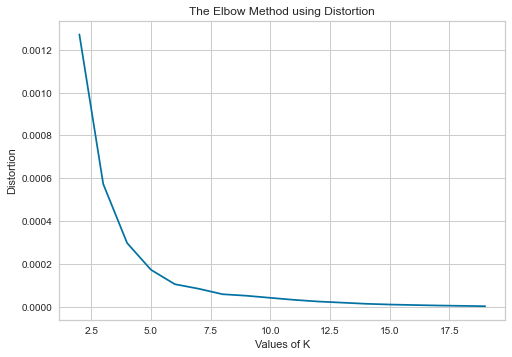

In [27]:
# Let's now plot the Elbow method using distortion obtained for k in the range between 2 and 20 
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

In [28]:
# print the inertia obtained for k in the range between 2 and 20 
for key,val in mapping2.items(): 
    print(str(key)+' : '+str(val))

2 : 0.0033649006791154307
3 : 0.0010446881024233847
4 : 0.00035503678290930003
5 : 0.0001361593959957702
6 : 6.752677074927899e-05
7 : 3.891911097278805e-05
8 : 2.419056387153111e-05
9 : 1.3000076652260308e-05
10 : 8.820806765996685e-06
11 : 5.69742701924033e-06
12 : 3.2576136523336013e-06
13 : 2.0676663270559885e-06
14 : 1.147324884490073e-06
15 : 7.376547297323925e-07
16 : 4.773730841693626e-07
17 : 3.440952832530791e-07
18 : 2.273218426014512e-07
19 : 1.4761092752014621e-07


Let's now plot the Elbow method using inertia obtained for k in the range between 2 and 20

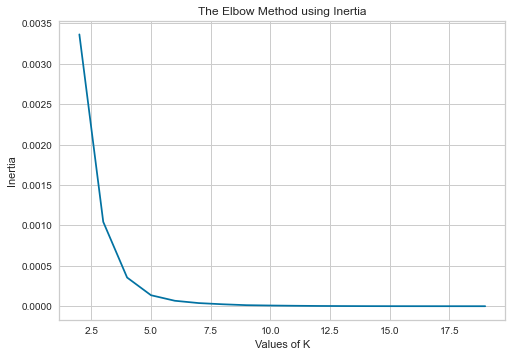

In [29]:
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 

Based on <b>Elbow Method</b> and as illustrated in both graphs, our optimum k is 5. So let's explore all the five clusters.

In [30]:
kclusters = 5
ny_grouped_clustering = med_restaurant.drop('Neighborhoods', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(ny_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 1, 1, 0, 1, 4, 1, 1, 1])

In [31]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
to_merged = med_restaurant.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_

In [32]:
to_merged.head(10)

,Neighborhoods,Mediterranean Restaurant,Cluster Labels
0,Allerton,0.000000,1
1,Annadale,0.000000,1
2,Arden Heights,0.000000,1
3,Arlington,0.000000,1
4,Arrochar,0.045455,0
5,Arverne,0.000000,1
6,Astoria,0.030303,4
7,Astoria Heights,0.000000,1
8,Auburndale,0.000000,1
9,Bath Beach,0.000000,1


In [33]:
# merge with ny_venues to add latitude/longitude for each neighborhood and display the first 5 entries in the new dataframe.
to_merged.rename(columns={'Neighborhoods': 'Neighborhood'}, inplace=True)
to_merged = to_merged.join(ny_venues.set_index("Neighborhood"), on="Neighborhood")
to_merged.head()

,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Allerton,0.0,1,40.865788,-73.859319,Domenick's Pizzeria,40.865576,-73.858124,Pizza Place
0,Allerton,0.0,1,40.865788,-73.859319,White Castle,40.866065,-73.862307,Fast Food Restaurant
0,Allerton,0.0,1,40.865788,-73.859319,Sal & Doms Bakery,40.865377,-73.855236,Dessert Shop
0,Allerton,0.0,1,40.865788,-73.859319,Bronx Martial Arts Academy,40.865721,-73.857529,Martial Arts School
0,Allerton,0.0,1,40.865788,-73.859319,Dunkin',40.865204,-73.859007,Donut Shop


In [34]:
# sort the results by Cluster Labels
print(to_merged.shape)
to_merged.sort_values(["Cluster Labels"], inplace=True)
to_merged

(10105, 9)


,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
227,Rego Park,0.047619,0,40.728974,-73.857827,CVS pharmacy,40.726791,-73.853772,Pharmacy
227,Rego Park,0.047619,0,40.728974,-73.857827,Grand Sichuan,40.727023,-73.854786,Chinese Restaurant
227,Rego Park,0.047619,0,40.728974,-73.857827,Lot-Less Closeouts,40.729423,-73.861465,Discount Store
227,Rego Park,0.047619,0,40.728974,-73.857827,T-Mobile,40.730024,-73.860795,Mobile Phone Shop
227,Rego Park,0.047619,0,40.728974,-73.857827,Family Fruit Farm,40.728757,-73.863367,Grocery Store
...,...,...,...,...,...,...,...,...,...
97,Flatiron,0.030000,4,40.739673,-73.990947,Tacombi Café El Presidente,40.742973,-73.991201,Mexican Restaurant
97,Flatiron,0.030000,4,40.739673,-73.990947,National Arts Club,40.737933,-73.986628,Art Gallery
97,Flatiron,0.030000,4,40.739673,-73.990947,Chapel Bar / V Bar,40.738979,-73.986833,Speakeasy
97,Flatiron,0.030000,4,40.739673,-73.990947,Novità Cucina Creativa,40.739455,-73.986548,Italian Restaurant


Let's now check the number of Meditterranean Restaurants in our merged dataframe.

In [35]:
to_merged['Venue Category'].value_counts()['Mediterranean Restaurant']

47

Then, we can visualize all of our 5 venue clusters using <b>Folium</b> python package.
<p><b><font color=red>Please note that map sometimes doesn't display using GitHub even if the notebook is Trusted. However, you can see the maps part of the final report</font></b></p>

In [36]:
# create map
map_clusters = folium.Map(location=[ny_latitude, ny_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(to_merged['Neighborhood Latitude'], to_merged['Neighborhood Longitude'], to_merged['Neighborhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.8).add_to(map_clusters)
       
map_clusters

In [38]:
# Let's get the Cluster Labels added
med_restaurant["Cluster Labels"] = kmeans.labels_
med_restaurant.head(10)

<ipython-input-38-ce1b1221235f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  med_restaurant["Cluster Labels"] = kmeans.labels_


,Neighborhoods,Mediterranean Restaurant,Cluster Labels
0,Allerton,0.000000,1
1,Annadale,0.000000,1
2,Arden Heights,0.000000,1
3,Arlington,0.000000,1
4,Arrochar,0.045455,0
5,Arverne,0.000000,1
6,Astoria,0.030303,4
7,Astoria Heights,0.000000,1
8,Auburndale,0.000000,1
9,Bath Beach,0.000000,1


## Part VI: Results Analysis and Evaluation

First let's examine how many neighborhoods we have in each cluster

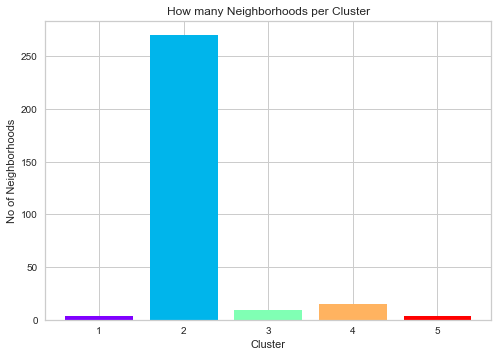

In [39]:
objects = (1,2,3,4,5)
y_pos = np.arange(len(objects))
performance = med_restaurant['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=1, color=['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('How many Neighborhoods per Cluster')

plt.show()

In [40]:
# How many neighborhoods in each cluster
med_restaurant['Cluster Labels'].value_counts()


1    270
3     15
2      9
4      4
0      4
Name: Cluster Labels, dtype: int64

In [41]:
ny_neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [42]:
# This will create a dataframe with borough of each neighborhood which we will merge with each cluster dataframe
df_new = ny_neighborhoods[['Borough', 'Neighborhood']]
df_new.head()

,Borough,Neighborhood
0,Bronx,Wakefield
1,Bronx,Co-op City
2,Bronx,Eastchester
3,Bronx,Fieldston
4,Bronx,Riverdale


First let's examine the average number of Mediterranean Restaurants in each cluster

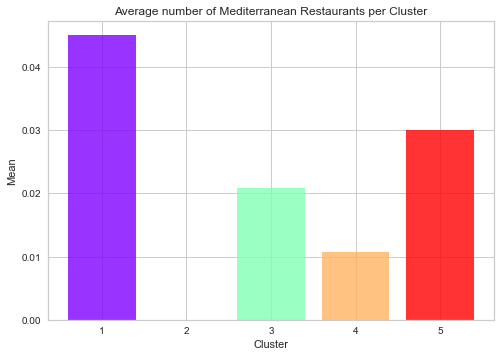

In [58]:
clusters_mean = [cluster_1['Mediterranean Restaurant'].mean(),cluster_2['Mediterranean Restaurant'].mean(),cluster_3['Mediterranean Restaurant'].mean(),
                 cluster_4['Mediterranean Restaurant'].mean(),cluster_5['Mediterranean Restaurant'].mean()]
objects = (1,2,3,4,5)
y_pos = np.arange(len(objects))
perf = clusters_mean
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Mediterranean Restaurants per Cluster')

plt.show()

<p><b>Cluster Exploration:</b></p>
Now, let's explore every cluster and how many Meditterranean Restaurant in each cluster

In [43]:
cluster_1 = to_merged.loc[to_merged['Cluster Labels'] == 0]
cluster_1 = pd.merge(df_new, cluster_1, on='Neighborhood')
cluster_1.sort_values(["Mediterranean Restaurant"], ascending=False)

,Borough,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Queens,Rego Park,0.047619,0,40.728974,-73.857827,CVS pharmacy,40.726791,-73.853772,Pharmacy
32,Queens,Rego Park,0.047619,0,40.728974,-73.857827,Rego Park Wines & Liquors,40.731312,-73.860061,Liquor Store
24,Queens,Rego Park,0.047619,0,40.728974,-73.857827,Dunkin',40.727152,-73.853196,Donut Shop
25,Queens,Rego Park,0.047619,0,40.728974,-73.857827,Fresh Value Market Place,40.729675,-73.862703,Health Food Store
26,Queens,Rego Park,0.047619,0,40.728974,-73.857827,Paris Baguette,40.730136,-73.861580,Bakery
...,...,...,...,...,...,...,...,...,...,...
63,Queens,Rockaway Park,0.040000,0,40.580343,-73.841534,The Beach at 118th Street,40.577346,-73.838159,Beach
64,Queens,Rockaway Park,0.040000,0,40.580343,-73.841534,Rockaway Beach - 120th Street,40.578322,-73.840387,Beach
65,Queens,Rockaway Park,0.040000,0,40.580343,-73.841534,Belle Harbor Steak & Seafood,40.581202,-73.837846,Steakhouse
66,Queens,Rockaway Park,0.040000,0,40.580343,-73.841534,Beach 126th St,40.577649,-73.846148,Beach


In [44]:
# Get the number of Mediterranean Restaurants in Cluster 1:
cluster_1['Venue Category'].value_counts()['Mediterranean Restaurant']

5

In [45]:
# Get the number of Venues in Cluster 1:
print('There are {} Unique Venues.'.format(len(cluster_1['Venue'].unique())))

There are 104 Unique Venues.


In [46]:
cluster_2 = to_merged.loc[to_merged['Cluster Labels'] == 1]
cluster_2 = pd.merge(df_new, cluster_2, on='Neighborhood')
cluster_2.sort_values(["Mediterranean Restaurant"], ascending=False)

,Borough,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bronx,Wakefield,0.0,1,40.894705,-73.847201,Koss Quick Wash,40.891281,-73.849904,Laundromat
5191,Queens,Bay Terrace,0.0,1,40.782843,-73.776802,WW (Weight Watchers),40.779026,-73.779324,Weight Loss Center
5159,Queens,Bay Terrace,0.0,1,40.553988,-74.139166,Key Food SuperStore,40.554627,-74.143766,Supermarket
5158,Queens,Bay Terrace,0.0,1,40.553988,-74.139166,Liquor Land,40.554070,-74.143502,Liquor Store
5157,Queens,Bay Terrace,0.0,1,40.553988,-74.139166,All County Garage Door,40.551868,-74.135523,Home Service
...,...,...,...,...,...,...,...,...,...,...
2571,Brooklyn,Prospect Park South,0.0,1,40.647009,-73.962613,Island Express,40.647111,-73.958108,Caribbean Restaurant
2570,Brooklyn,Prospect Park South,0.0,1,40.647009,-73.962613,Downtown Natural Market,40.649271,-73.963707,Grocery Store
2569,Brooklyn,Prospect Park South,0.0,1,40.647009,-73.962613,Mattress Firm,40.648562,-73.958382,Mattress Store
2568,Brooklyn,Prospect Park South,0.0,1,40.647009,-73.962613,Angelo's Pizza,40.644068,-73.958202,Pizza Place


In [47]:
# Get the number of Mediterranean Restaurants in Cluster 2:
print('There are {} Unique Venues.'.format(len(cluster_2['Venue'].unique())))

There are 6001 Unique Venues.


In [48]:
cluster_3 = to_merged.loc[to_merged['Cluster Labels'] == 2]
cluster_3 = pd.merge(df_new, cluster_3, on='Neighborhood')
cluster_3.sort_values(["Mediterranean Restaurant"], ascending=False)


,Borough,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Brooklyn,Brighton Beach,0.023256,2,40.576825,-73.965094,Ocean parkway reigelmans boardwalk,40.574756,-73.968583,Beach
519,Manhattan,Morningside Heights,0.023256,2,40.808000,-73.963896,Nous Espresso Bar - Graduate Student Center,40.807533,-73.960879,Café
495,Manhattan,Morningside Heights,0.023256,2,40.808000,-73.963896,Hartley Pharmacy,40.809272,-73.959231,Pharmacy
494,Manhattan,Morningside Heights,0.023256,2,40.808000,-73.963896,Broadway Au Lait,40.811514,-73.961346,Coffee Shop
493,Manhattan,Morningside Heights,0.023256,2,40.808000,-73.963896,Columbia Opticians,40.810312,-73.958881,Optical Shop
...,...,...,...,...,...,...,...,...,...,...
359,Manhattan,Midtown,0.020000,2,40.754691,-73.981669,Joanna Vargas Skin Care,40.753136,-73.980721,Spa
358,Manhattan,Midtown,0.020000,2,40.754691,-73.981669,The Lionel Pincus and Princess Firyal Map Divi...,40.753423,-73.981686,Art Gallery
357,Manhattan,Midtown,0.020000,2,40.754691,-73.981669,Stone Bridge Pizza & Salad,40.752586,-73.980459,Pizza Place
356,Manhattan,Midtown,0.020000,2,40.754691,-73.981669,L'ADRESSE,40.753766,-73.985096,Café


In [49]:
# Get the number of Mediterranean Restaurants in Cluster 3:
cluster_3['Venue Category'].value_counts()['Mediterranean Restaurant']

15

In [50]:
# Get the number of Mediterranean Restaurants in Cluster 3:
print('There are {} Unique Venues.'.format(len(cluster_3['Venue'].unique())))

There are 681 Unique Venues.


In [51]:
cluster_4 = to_merged.loc[to_merged['Cluster Labels'] == 3]
cluster_4 = pd.merge(df_new, cluster_4, on='Neighborhood')
cluster_4.sort_values(["Mediterranean Restaurant"], ascending=False)

,Borough,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
352,Manhattan,Hamilton Heights,0.015873,3,40.823604,-73.949688,Harlem Brothers Pizza,40.823895,-73.944182,Pizza Place
384,Manhattan,Hamilton Heights,0.015873,3,40.823604,-73.949688,Wat’s On Your Plate,40.825632,-73.948494,Caribbean Restaurant
386,Manhattan,Hamilton Heights,0.015873,3,40.823604,-73.949688,Anchor Wine Bar,40.825424,-73.951204,Wine Bar
387,Manhattan,Hamilton Heights,0.015873,3,40.823604,-73.949688,Bikram Yoga Harlem,40.825672,-73.948887,Yoga Studio
388,Manhattan,Hamilton Heights,0.015873,3,40.823604,-73.949688,Fumo,40.821412,-73.950499,Italian Restaurant
...,...,...,...,...,...,...,...,...,...,...
898,Queens,Murray Hill,0.006849,3,40.748303,-73.978332,Maison Thai,40.744969,-73.975770,Thai Restaurant
899,Queens,Murray Hill,0.006849,3,40.748303,-73.978332,Windsor Wine Shop,40.744696,-73.978847,Wine Shop
900,Queens,Murray Hill,0.006849,3,40.748303,-73.978332,Baby Bo's Cantina,40.745048,-73.975748,Mexican Restaurant
901,Queens,Murray Hill,0.006849,3,40.748303,-73.978332,Spice Symphony,40.744652,-73.981020,Indian Restaurant


In [52]:
# Get the number of Mediterranean Restaurants in Cluster 4:
cluster_4['Venue Category'].value_counts()['Mediterranean Restaurant']

16

In [53]:
# Get the number of venues in Cluster 4:
print('There are {} Unique Venues.'.format(len(cluster_4['Venue'].unique())))

There are 1280 Unique Venues.


In [54]:
cluster_5 = to_merged.loc[to_merged['Cluster Labels'] == 4]
cluster_5 = pd.merge(df_new, cluster_5, on='Neighborhood')
cluster_5.sort_values(["Mediterranean Restaurant"], ascending=False)

,Borough,Neighborhood,Mediterranean Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
201,Queens,Astoria,0.030303,4,40.768509,-73.915654,Burger Club,40.766487,-73.920578,Burger Joint
275,Queens,Astoria,0.030303,4,40.768509,-73.915654,Sugar Freak,40.764443,-73.916055,Cajun / Creole Restaurant
273,Queens,Astoria,0.030303,4,40.768509,-73.915654,Tikka Indian Grill,40.765397,-73.918658,Indian Restaurant
272,Queens,Astoria,0.030303,4,40.768509,-73.915654,Chip,40.765517,-73.919339,Dessert Shop
271,Queens,Astoria,0.030303,4,40.768509,-73.915654,Basil Brick Oven Pizza,40.770865,-73.920080,Pizza Place
...,...,...,...,...,...,...,...,...,...,...
130,Manhattan,Soho,0.030000,4,40.722184,-74.000657,Pi Greek Bakerie,40.723516,-74.003444,Bakery
129,Manhattan,Soho,0.030000,4,40.722184,-74.000657,Y7 Studio - Soho,40.721441,-73.998936,Yoga Studio
128,Manhattan,Soho,0.030000,4,40.722184,-74.000657,La Esquina,40.721598,-73.997471,Mexican Restaurant
127,Manhattan,Soho,0.030000,4,40.722184,-74.000657,Crosby Street Hotel,40.723011,-73.997454,Hotel


In [55]:
# Get the number of Mediterranean Restaurants in Cluster 5:
cluster_5['Venue Category'].value_counts()['Mediterranean Restaurant']

12

In [59]:
# Get the number of Mediterranean Restaurants in Cluster 5:
print('There are {} Unique Venues.'.format(len(cluster_5['Venue'].unique())))

There are 346 Unique Venues.


## Results Evaluation:

Based on the above analysis of all our optimum clusters, we can conclude that The concentration of Mediterranean restaurants in New York City are in Clusters 1 and 5 with the neighborhoods Rego Park, Rockway Park, Astoria, Soho and Flatiron have the highest average of Mediterranean restaurants followed by Clusters 3 and 4. We can conclude that both boroughs Queens and Manhattan share the highest number of Mediterranean restaurants in followed by Brooklynn while Bronx and Staten Island have little to no Mediterranean restaurants. In addition, Cluster 2 has the greatest number of neighborhoods at 270, but no Mediterranean restaurant.
Therefore, we think that the optimum place to put a new Mediterranean Restaurant is in Staten Island as there are 63 Neighborhoods in the area but no Mediterranean Restaurants, hence, eliminating any competition. The second-best Borough is the Bronx, having 70 neighborhoods in the area with little to no Mediterranean Restaurants gives a good opportunity for opening a new restaurant. 
Finally, note that some of the drawbacks of this analysis are that the clustering is completely based on data obtained from the Foursquare API. Also, the analysis does not take into consideration of additional features for example menu cost, menu price average of other restaurants, neighborhood traffic, etc... 
